In [1]:
import matplotlib.pyplot as plt

def plot_images_from_array(array, path):

    fig, axes = plt.subplots(3, 6, figsize=(15, 8))
    axes = axes.flatten()

    for i in range(min(18, array.shape[0])):
        img_array = array[i]  # shape (3, 32, 64)
        img_array = np.transpose(img_array, (1, 2, 0))  # shape (32, 64, 3)
        # img_array = np.clip(img_array, 0, 255).astype(np.uint8)

        axes[i].imshow(img_array)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

    plt.tight_layout()
    plt.savefig(path)

In [11]:
def s3_save_numpy(array, bucket_name, key):
    byte_stream = io.BytesIO()
    np.save(byte_stream, array, allow_pickle=False)
    byte_stream.seek(0)
    s3.upload_fileobj(byte_stream, bucket_name, key)
    
def s3_load_numpy(bucket_name, file_key):
    response = s3.get_object(Bucket=bucket_name, Key=file_key)
    data = response['Body'].read()
    return np.load(io.BytesIO(data))

15
15


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99215686..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9843137..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with R

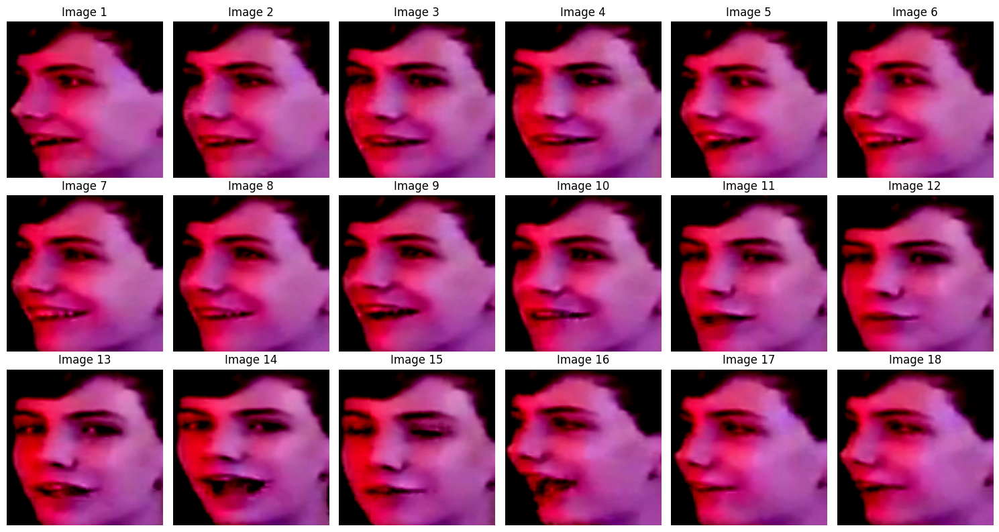

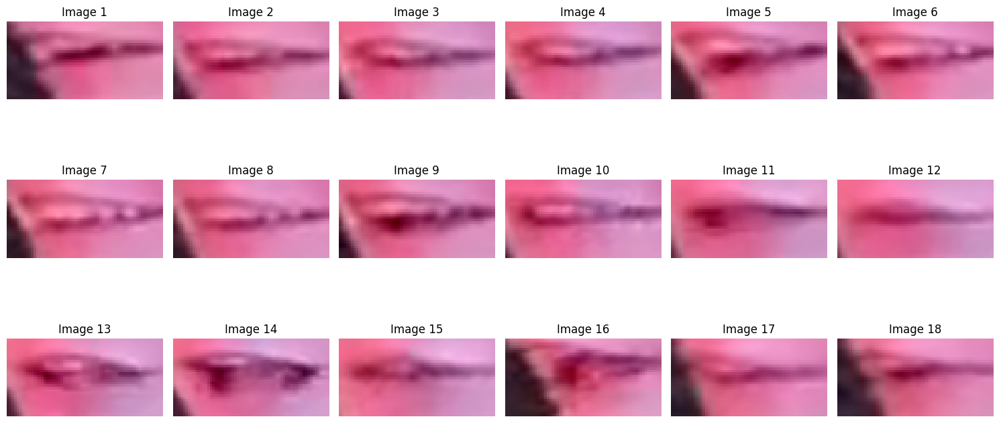

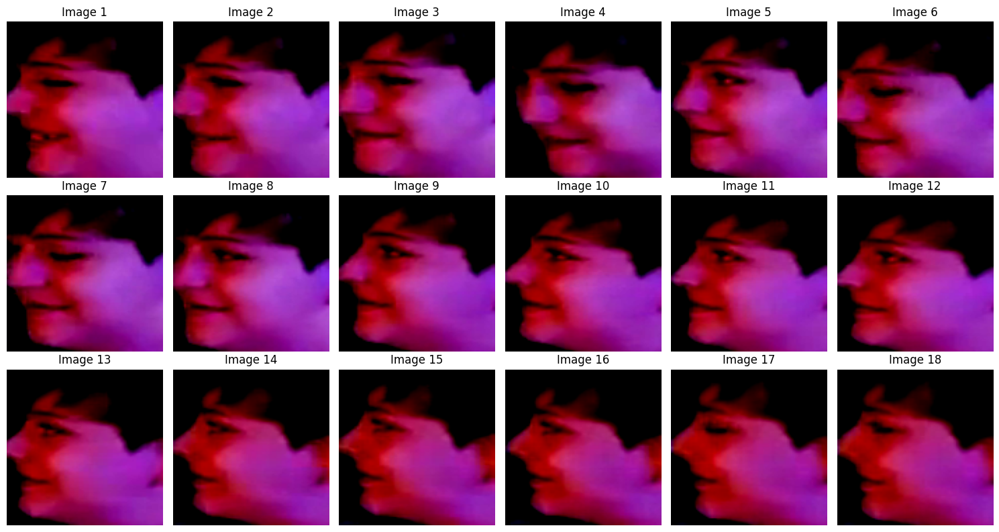

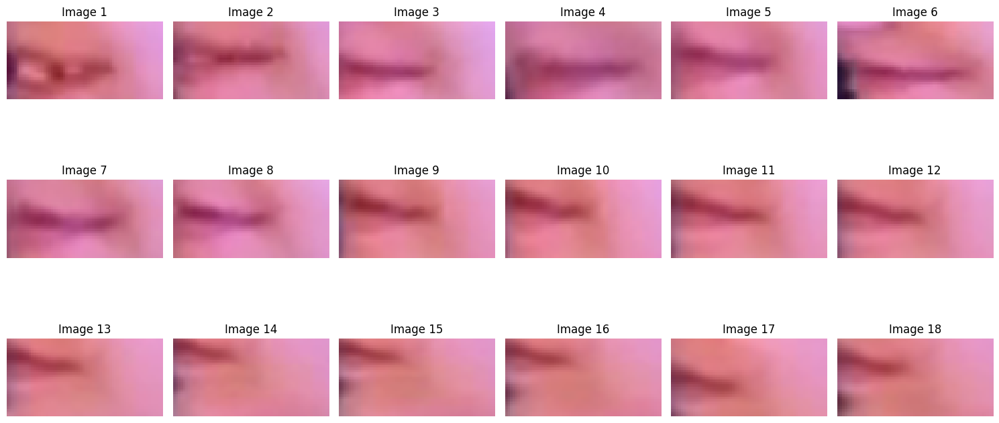

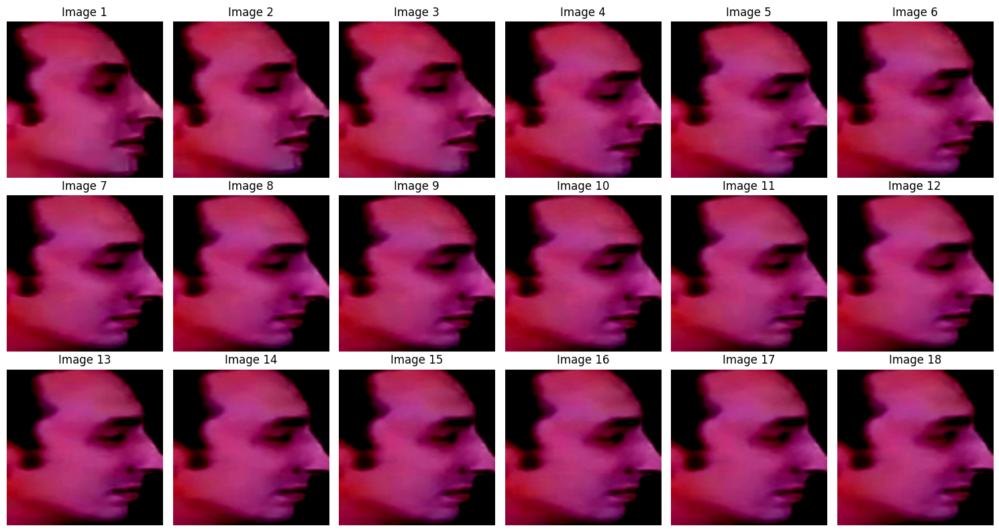

...

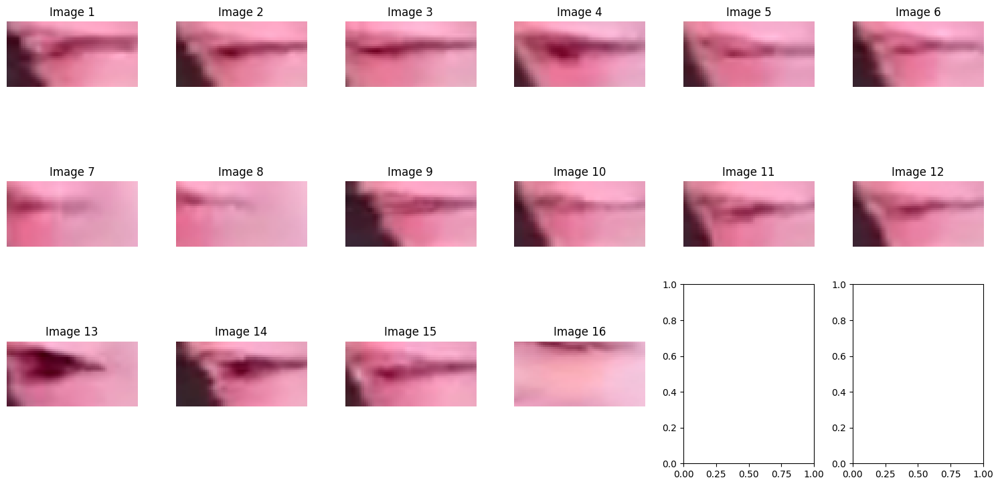

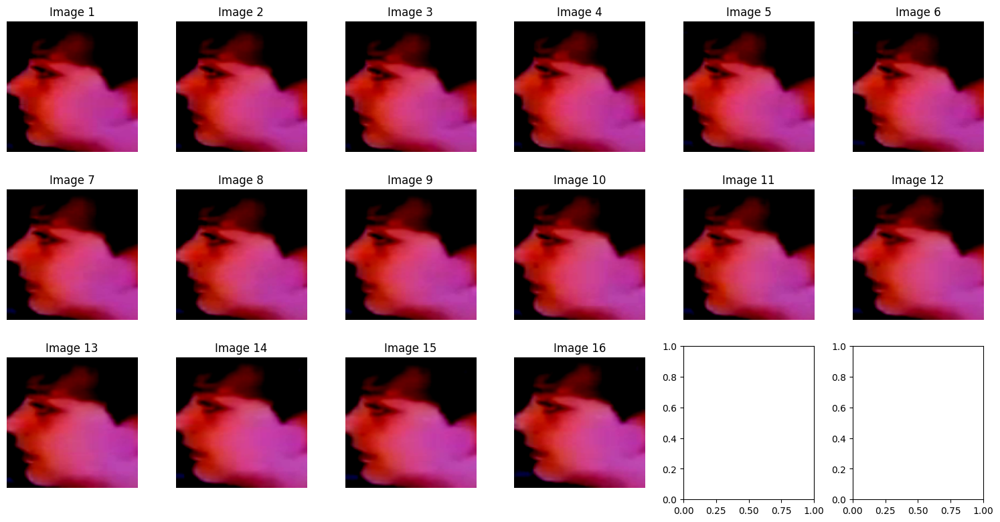

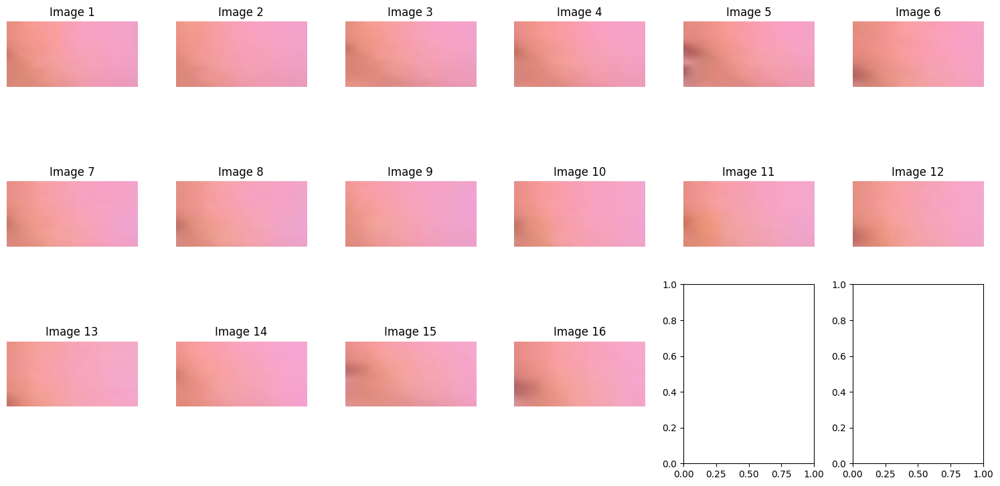

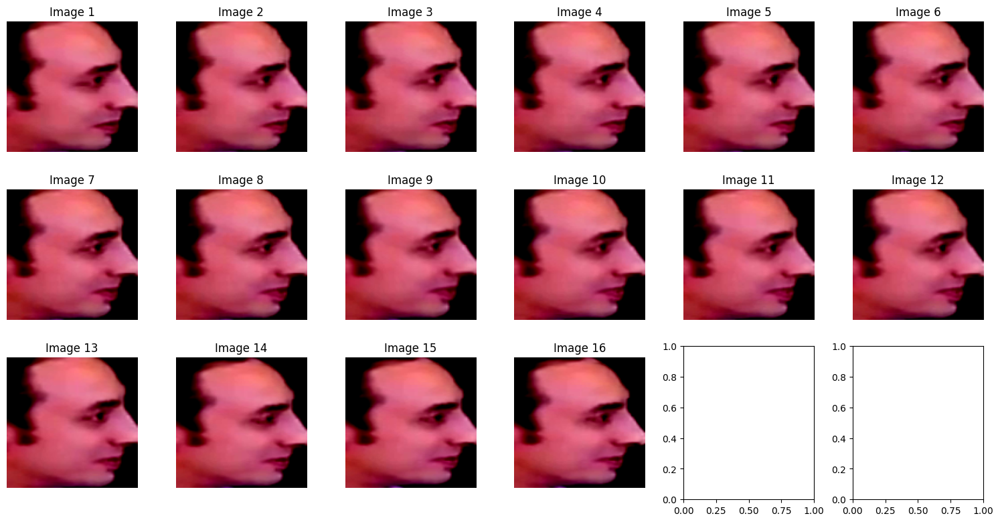

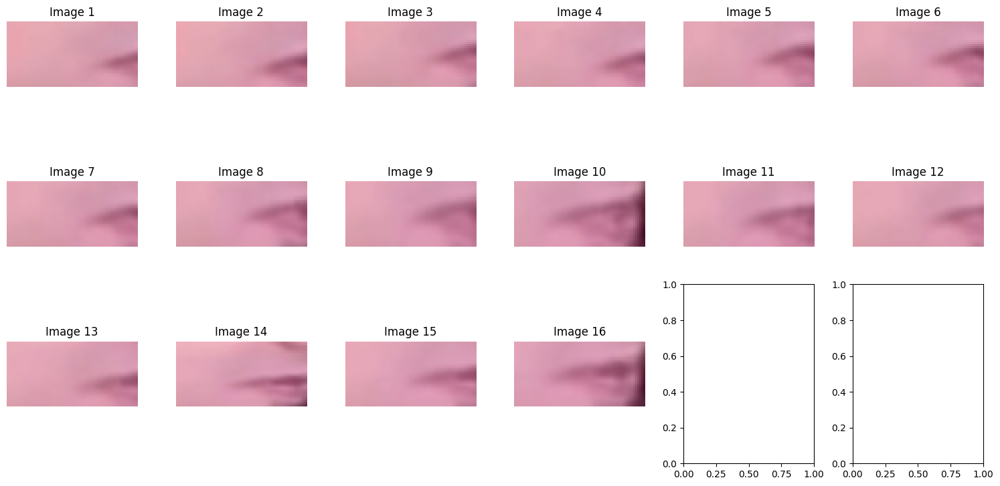

In [15]:
import os
import boto3
import numpy as np
import io
# Initialize S3 client
s3 = boto3.client('s3')

bucket_name = 'mmml-proj'
prefix = 'preprocessed_2/00001/'  # Optional. Set to '' if you want the whole bucket.

# Paginate through objects in the bucket/prefix
paginator = s3.get_paginator('list_objects_v2')
pages = paginator.paginate(Bucket=bucket_name, Prefix=prefix)

# Collect keys that contain 'face_'
face_keys = []

for page in pages:
    if 'Contents' in page:
        for obj in page['Contents']:
            key = obj['Key']
            if 'face_' in key:
                face_keys.append(key)

lip_keys = []
for page in pages:
    if 'Contents' in page:
        for obj in page['Contents']:
            key = obj['Key']
            if 'lip_' in key:
                lip_keys.append(key)

print(len(face_keys))
print(len(lip_keys))
for i, face_key in enumerate(face_keys):
    face_batch = s3_load_numpy(bucket_name, face_key)
    plot_images_from_array(face_batch, f"face_{i}.png")
    lip_batch = s3_load_numpy(bucket_name, lip_keys[i])
    plot_images_from_array(lip_batch, f"lip_{i}.png")
    